In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, make_scorer
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Importing UMAP, setting parameters

In [2]:
import numpy as np
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib inline

In [3]:
sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})

In [4]:
#import xgboost as xgb

In [6]:
#reading in CO hotspot with features
#classified into COs and CO hotspots
df = pd.read_csv('final_COhotspot_single_CO_withrate_v4.bed', sep='\t',header=None,names=["chrom", "start", "end", "occupancy","CG.",'CHG.',"Type","Indel Density","distCent","distTelo","distProm","distMLH3","SNP Density", "Rate"])
display(df)

,chrom,start,end,occupancy,CG.,CHG.,Type,Indel Density,distCent,distTelo,distProm,distMLH3,SNP Density,Rate
0,3,592498,603605,0.023148,73.152099,55.893417,single_CO,0.005582,87796395.0,592498,18,19,0.016566,1
1,3,603603,617270,0.017920,85.973217,64.489587,single_CO,0.006366,87782730.0,603603,18,19,0.020121,1
2,6,664320,666471,0.026094,37.164453,24.893589,single_CO,0.049279,31583529.0,664320,12,14,0.031613,1
3,9,740745,742306,NaN,13.445771,20.323887,single_CO,0.033953,33407694.0,740745,15,16,0.040359,1
4,3,751490,762638,0.016145,64.674881,38.162263,single_CO,0.022156,87637362.0,751490,23,21,0.021259,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7216,1,300940464,300954657,0.016153,24.364555,13.798589,Hotspots,0.018460,173940464.0,6101253,6584,4637,0.038751,10
7217,1,301293728,301303332,0.022078,20.213609,2.351296,Hotspots,0.013536,174293728.0,5747989,6603,4650,0.032591,6
7218,1,304511350,304526834,0.012868,37.247137,27.070728,Hotspots,0.021183,177511350.0,2530367,6720,4712,0.039848,7
7219,1,305013942,305020232,0.029454,8.816116,0.267764,Hotspots,0.017011,178013942.0,2027775,6741,4721,0.023847,20


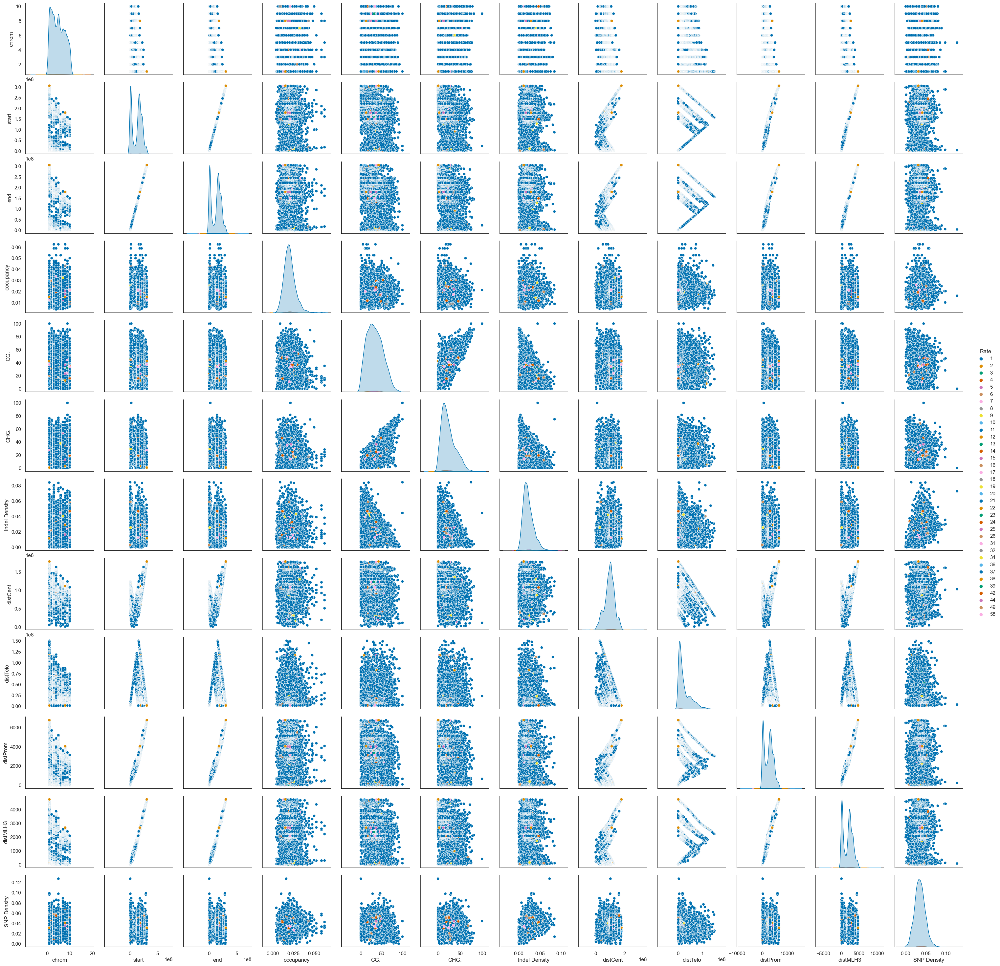

In [7]:
#dealing with missing data, usually as NA
df.dropna(inplace = True)
df.sort_values(by=['chrom','start'],ascending=True, inplace=True)
#create pairplot-get all the 2D views of the data
sns.pairplot(df,hue='Rate',palette='colorblind');

In [10]:
import umap

## Approach 1: visualizing classification data

In [11]:
#instantiate umap, set hyperparameters
import plotly.express as px
umap_2d=umap.UMAP(n_components=2,init='random',random_state=0)
umap_3d=umap.UMAP(n_components=3,init='random',random_state=0)
co_data = df[['occupancy', 'CG.', 'CHG.',
       'Indel Density', 'distCent', 'distTelo', 'distProm','distMLH3',
       'SNP Density']].values

In [12]:
#scale data for variance stabilization
scaled_co_data = StandardScaler().fit_transform(co_data)
proj_2d=umap_2d.fit_transform(scaled_co_data)
#visualize classification of data in 2D
fig_2d=px.scatter(proj_2d,x=1,y=0,color=df.Type,labels={'color':'Type'},size=df["Rate"],color_discrete_sequence=['#14aaf5','#7ecc49'])
fig_2d.update_layout(title='UMAP projection of the CO dataset',
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',template='simple_white')
fig_2d.show()

In [13]:
#visualize classification of data in 3D
proj_3d=umap_3d.fit_transform(scaled_co_data)
fig_3d=px.scatter_3d(proj_3d,x=0,y=1,z=2,color=df.Type,labels={'color':'Type'},size=df["Rate"],color_discrete_sequence=['#14aaf5','#7ecc49'])
fig_3d.update_layout(title='UMAP projection of the CO dataset',
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',template='simple_white')
fig_3d.show()

## Approach 2: log transformation of rate data

In [14]:
import plotly.express as px
umap_2d=umap.UMAP(n_components=2,init='random',random_state=0, n_neighbors=30, min_dist=.25)
umap_3d=umap.UMAP(n_components=3,init='random',random_state=0,n_neighbors=30, min_dist=.25)
co_data = df[['occupancy', 'CG.', 'CHG.',
       'Indel Density', 'distCent', 'distTelo', 'distProm','distMLH3',
       'SNP Density']].values

In [15]:
#visualize log transformed rate data in 2D
scaled_co_data = StandardScaler().fit_transform(co_data)
proj_2d=umap_2d.fit_transform(scaled_co_data)
fig_2d=px.scatter(proj_2d,x=0,y=1,color=df.Rate,labels={'color':'Rate'},size=df["Rate"],color_continuous_scale='rainbow_r')
#fig_2d.update_traces(jitter = 1)
fig_2d.update_layout(title='UMAP projection of the CO dataset',
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',template="simple_white")
fig_2d.show()

In [21]:
#visualize log transformed rate data in 3D
proj_3d=umap_3d.fit_transform(scaled_co_data)
fig_3d=px.scatter_3d(proj_3d,x=0,y=1,z=2,color=df.Rate,labels={'color':'Rate'},size=df["Rate"],color_continuous_scale='rainbow_r')
#fig_3d.update_traces(marker_size=2)
fig_3d.update_layout(title='UMAP projection of the CO dataset',
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',template='simple_white')
fig_3d.show()